In [1]:
# Plot displacements plus error

# Set up code

In [2]:
# Load libraries
import sys
import sys
sys.path.append("../../xapres_package/")
import ApRESDefs
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker 

import xarray as xr
import importlib
import pandas as pd
import math
from datetime import datetime, timedelta, date
from scipy.stats import linregress


importlib.reload(ApRESDefs)
xa = ApRESDefs.xapres(loglevel='debug')

DEBUG    19:57:19 	 ApRESDefs.py @function _setup_logging line 615 - Stream logging level set to DEBUG
DEBUG    19:57:19 	 ApRESDefs.py @function _setup_logging line 616 - Add console handler to logger
DEBUG    19:57:19 	 ApRESDefs.py @function _setup_logging line 629 - File logging level set to DEBUG


In [3]:
# Load data
def reload(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        chunks={}) 
    return ds

ds_101 = reload("A101")
ds_103 = reload("A103_fixed")
ds_104 = reload("A104")

ds_101 = ds_101.isel(time=range(20,len(ds_101.time)))
ds_103 = ds_103.isel(time=range(60,len(ds_103.time)))
ds_104 = ds_104.isel(time=range(50,len(ds_104.time)))


def reload_winter(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}_winter22_23'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds

ds_101_w = reload_winter("A101")
ds_103_w = reload_winter("A103")
ds_104_w = reload_winter("A104")

def reload_summer(site):
    filename = f'gs://ldeo-glaciology/apres/greenland/2022/single_zarrs_noencode/{site}_summer_23'
    ds = xr.open_dataset(filename,
        engine='zarr', 
        consolidated=True, 
        chunks={}) 
    return ds

ds_101_s = reload_summer("A101")
ds_103_s = reload_summer("A103")
ds_104_s = reload_summer("A104")

In [4]:
from dask.distributed import Client

client = Client("tcp://127.0.0.1:34677")
client

<Client: 'tcp://127.0.0.1:34677' processes=7 threads=28, memory=220.16 GiB>

# Define helper functions
This is to streamline the code

In [42]:
# define function
def custom_stacked_profile_series(chirps,pad=2,F0=2e8,F1=4e8):
    StartFreq = 2e8
    StopFreq = 4e8
    B = StopFreq - StartFreq
    CentreFreq = B/2
    K = 2e8 
    dt = 1/40000
    c0 = 3e8 # speed of light in vaccuum
    ER_ICE = 3.18
    T0 = (F0-StartFreq)/K
    T1 = (F1-StartFreq)/K

    chirps = chirps.isel(chirp_time=range(math.ceil(T0/dt),math.floor(T1/dt)+1)).mean(dim='chirp_num')
    window = np.blackman(len(chirps.chirp_time))
    win_chirps = chirps*window
    Nt = len(chirps.chirp_time)
    Nfft = math.floor(Nt*pad)
    bin2m = c0/(2.*(T1-T0)*pad*math.sqrt(ER_ICE)*K)
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    padchirp = np.zeros((len(chirps.time),Nfft))
    padchirp[:,0:math.floor(Nt/2)] = win_chirps.data[:,math.floor(Nt/2):-1]
    padchirp[:,-math.floor(Nt/2):] = win_chirps.data[:,0:math.floor(Nt/2)]
    p = np.fft.fft(padchirp,axis=1)/Nfft * math.sqrt(2*pad)
    profile = p[:,0:math.floor(Nfft/2)-1]
    m = np.asarray([i for i in range(profile.shape[1])])/pad
    phiref = 2*math.pi*CentreFreq*m/B - m * m * 2*math.pi * K/2/B**2
    profile_ref = profile * np.exp(phiref[np.newaxis,:]*(-1j))
    profile_range = np.asarray([i for i in range(Nfft)]) * bin2m      
    profile_range = profile_range[0:math.floor(Nfft/2)-1]
    n = np.argmin(profile_range<=1400)
    Range = profile_range[:n]
    Profile = profile_ref[:,:n]
    da = xr.DataArray(Profile,
                  dims=['time','profile_range'],
                  coords={'profile_range': Range,
                         'time': chirps.time.data})
    return da
    
def plot_profile(to_plot,station,season):
    fig, ax = plt.subplots(figsize=(18,6))
    fg = xa.dB(to_plot).plot(ax=ax,x='time')
    fg.colorbar.ax.tick_params(labelsize=18)
    fg.colorbar.set_label(label='reflector amplitude [dB]', size=18)
    ax.invert_yaxis()
    ax.set_title(f"{season} englacial reflector amplitudes at {station}",fontsize=18)
    plt.xlabel('Date',fontsize=18)
    plt.ylabel('range [m]',fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=18)
    
def strain_metrics(ds, win_cor, step, lag):
    # This function, given a window, and step, gives a total percentage of data that has high coherence
    b1 = ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    dz, co, phi = xa.generate_range_diff(b1,b2,win_cor,step,None,0,0.95)
    dz=dz.assign(coherence=(['time','profile_range'],co))
    dz_new = dz.where(abs(dz.coherence) > 0.95).drop_duplicates('time')

    vv = dz_new.range_diff / dz_new.time_diff * 31536000
    vv_err = dz_new.err / dz_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=600).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv-vv.mean())**2).sum(dim='profile_range')
    return np.count_nonzero(abs(co)>0.95)/np.count_nonzero(co), np.mean(abs(co)), np.mean(r2).values

def optimal_window_and_leapfrog(ds):
    max_score = 0
    windows = np.arange(20,90,10)
    lags = np.round(np.logspace(0,3,7)).astype('int')
    pct_mat = np.zeros((len(windows),len(lags)))
    r2_mat = np.zeros((len(windows),len(lags)))
    for i in range(len(windows)):
        step = windows[i] # earlier experiments show step doesn't change results by much
        #for step in [10,20,40,80]:
        #    if step <= window:
        for j in range(len(lags)):
            pct,mean,r2 = strain_metrics(ds, windows[i], step,lags[j])
            print(f"Window {windows[i]}, lag {lags[j]} -> pct {pct:.2}, r2 {r2:.2}")
            pct_mat[i,j] = pct
            r2_mat[i,j]=r2
            # mean coherence not relevant I think
            temp_score = pct+r2
            if temp_score > max_score:
                max_score = temp_score
                to_return = windows[i],lags[j]
            
    fig, axs = plt.subplots(ncols=2,figsize=(15,5))
    plt0 = axs[0].pcolormesh(100*pct_mat)
    plt.colorbar(plt0,ax=axs[0],label='percentage of data with high coherence (>0.95)')
    axs[0].set_xticks(np.arange(pct_mat.shape[1]) + 0.5, minor=False)
    axs[0].set_yticks(np.arange(pct_mat.shape[0]) + 0.5, minor=False)
    axs[0].set_xticklabels(lags)
    axs[0].set_yticklabels(windows)
    axs[0].set_ylabel('Correlation window size [points included]')
    axs[0].set_xlabel('Lag between bursts [num. bursts seperated]')
    axs[0].set_title('High coherence percentage')


    plt1 = axs[1].pcolormesh(r2_mat)
    plt.colorbar(plt1,ax=axs[1],label='Average r^2 of linear strain fits')
    axs[1].set_xticks(np.arange(r2_mat.shape[1]) + 0.5, minor=False)
    axs[1].set_yticks(np.arange(r2_mat.shape[0]) + 0.5, minor=False)
    axs[1].set_xticklabels(lags)
    axs[1].set_yticklabels(windows)
    axs[1].set_ylabel('Correlation window size [points included]')
    axs[1].set_xlabel('Lag between bursts [num. bursts seperated]')
    axs[1].set_title('Mean strain rate fit r-squared')

    return to_return

def generate_strain_fit(ds,window,lag):
    b1= ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    ds_new = ds_full.where(abs(ds_full.coherence) > 0.95).drop_duplicates('time')

    vv = ds_new.range_diff / ds_new.time_diff * 31536000
    vv_err = ds_new.err / ds_new.time_diff * 31536000
    fit=vv.where(vv.profile_range <=600).polyfit('profile_range',1,full=True)
    r2 = 1-fit.polyfit_residuals/((vv-vv.mean())**2).sum(dim='profile_range')
    fig, axs = plt.subplots(nrows=2,figsize=(10,6),sharex=True)
    axs[0].plot(fit.time.values,fit.polyfit_coefficients.sel(degree=1).values)
    #axs[0].set_ylim([-1e-2,1e-2])
    axs[0].set_ylabel('Strain rate [y$^{-1}$]')
    axs[0].set_title('Strain fitting results')
    axs[1].plot(fit.time.values,r2.values)
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('r$^2$')
    return ds_new,fit

def plot_displacement(ds,window,lag):
    b1= ds.isel(time=range(0,len(ds)-lag))
    b2 = ds.isel(time=range(lag,len(ds)))
    ds_full, co_full, phi_full = xa.generate_range_diff(b1,b2,window,window,None,0,0.95)
    #ds_full['doy_decimal'] = ds_full.time.dt.dayofyear + (ds_full.time.dt.hour / 24) + (ds_full.time.dt.minute / 1440) + (ds_full.time.dt.second / 86400)
    ds_full=ds_full.assign(coherence=(['time','profile_range'],co_full))
    fig, [ax,cax] = plt.subplots(1,2, gridspec_kw=dict(width_ratios=[40,1]),figsize=(12,6))
    im = ax.pcolormesh(ds_full.time,ds_full.profile_range,abs(co_full).transpose())
    cbar = fig.colorbar(im, cax=cax)
    cbar.ax.tick_params(labelsize=18)
    cbar.set_label(label='reflector amplitude [dB]', size=18)
    
    ax.set_ylim([0,1200])
    #ax.set_xlim([194.25,196])
    ax1= ax.twinx()
    ax1.set_ylim([0,10])
    
    ax.invert_yaxis()
    ax1.invert_yaxis()
    count = 0
    for i in np.arange(0,len(ds_full.profile_range),len(ds_full.profile_range)//20):
        if count > 0 and count < 10 or count > 15:
            to_plt = ds_full.range_diff.cumsum(dim='time').isel(profile_range = i) + ds_full.profile_range.isel(profile_range = i)/120
            #to_plt['doy_decimal'] = to_plt.time.dt.dayofyear + (to_plt.time.dt.hour / 24) + (to_plt.time.dt.minute / 1440) + (to_plt.time.dt.second / 86400)
            to_plt.plot(ax=ax1,x='time',color='k',linestyle='None',marker='.')
        count += 1
    ax.set_title('Reflector displacements',fontsize=18)
    ax1.set_title('')
    ax.set_ylabel('coherence & initial reflector depth [m]',fontsize=18)
    ax1.set_ylabel('reflector displacement scale [m]',fontsize=18)
    ax.set_xlabel('Date',fontsize=18)
    
    ax.tick_params(axis='both', which='major', labelsize=18)
    ax1.tick_params(axis='both', which='major', labelsize=18)
    
    ds_full = ds_full.where(abs(ds_full.coherence)> 0.95)
    return ds_full
    
def plot_displacement_2d(ds):
    fig, axs = plt.subplots(figsize=(20,5),ncols=2,sharey=True)
    ds.range_diff.plot(ax=axs[0],x='time',vmin=-0.02,vmax=0.02,cmap='RdBu')
    axs[0].invert_yaxis()
    #labels = [item.get_text() for item in ax.get_xticklabels()]
    #new_labels = [str(float(x)+ 181) for x in labels] 
    #ax.set_xticklabels(new_labels)
    axs[0].set_xlabel('Date')
    ds.err.plot(ax=axs[1],x='time',cmap='Blues')
    axs[1].invert_yaxis()
    axs[1].set_xlabel('Date')



## A11

### Summer 2022

In [44]:
to_plot = custom_stacked_profile_series(ds_101.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


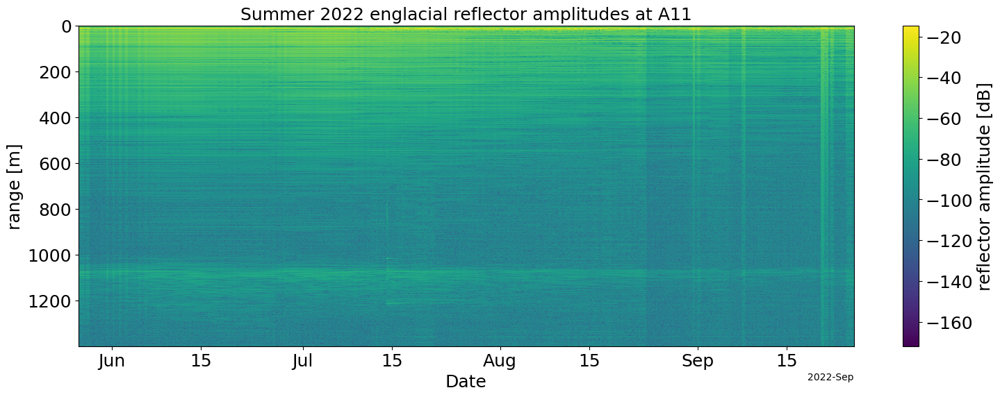

In [45]:
plot_profile(to_plot,'A11','Summer 2022')

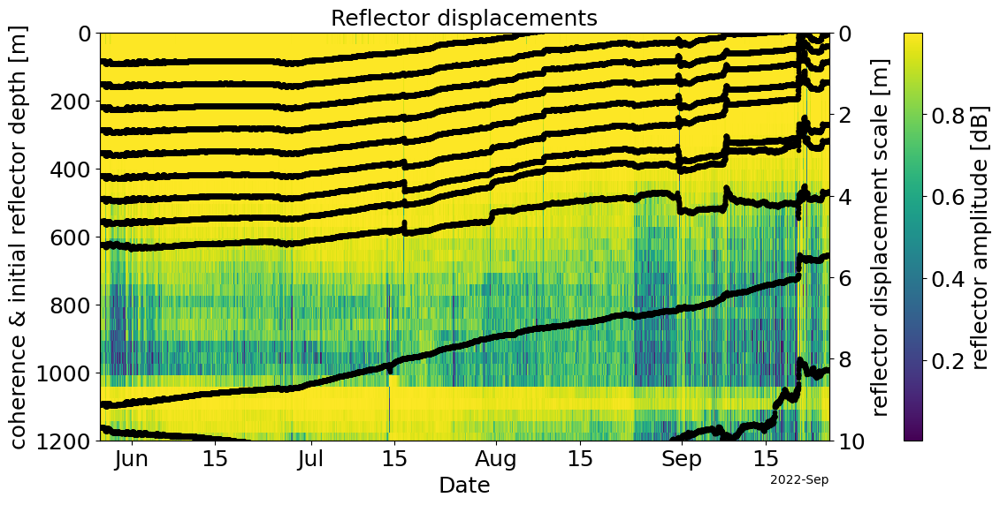

In [46]:
ds_full = plot_displacement(to_plot,80,1)

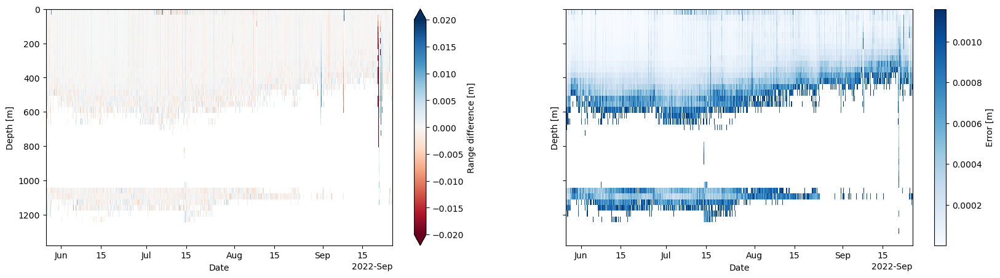

In [47]:
plot_displacement_2d(ds_full)

### Winter 2022-2023

In [48]:
to_plot = ds_101_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


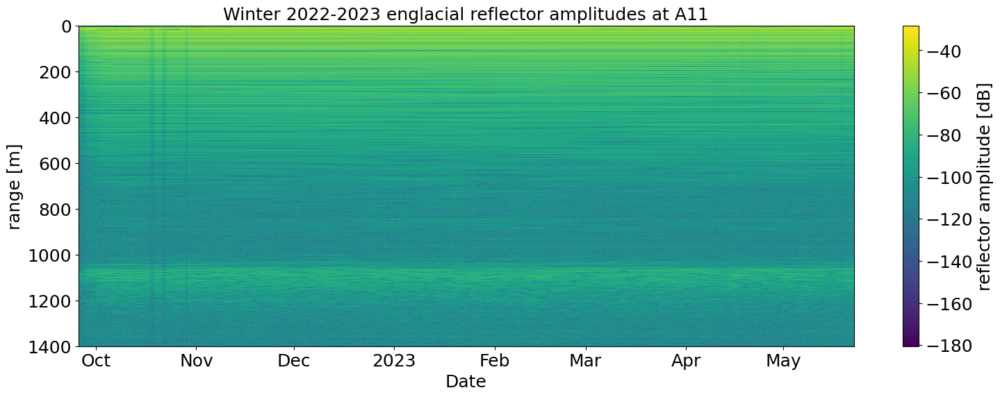

In [49]:
plot_profile(to_plot,'A11','Winter 2022-2023')

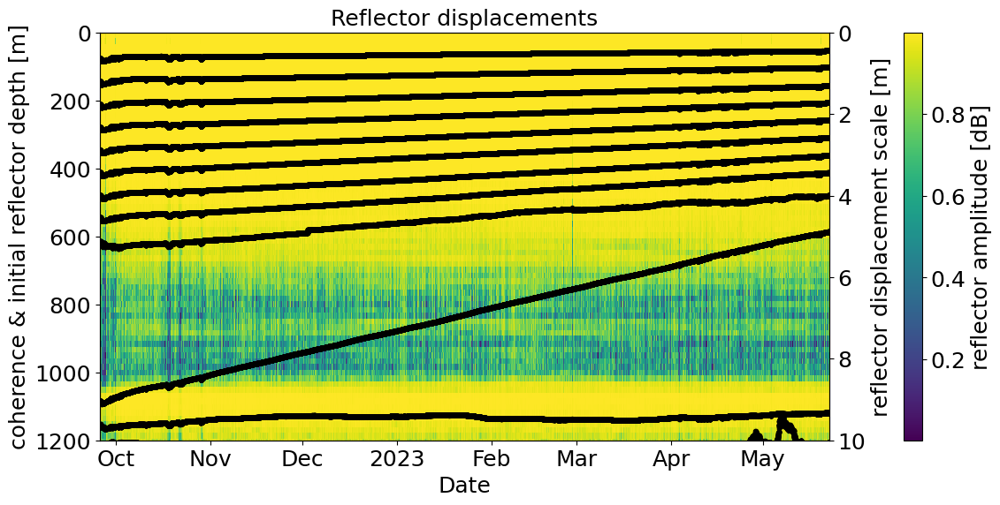

In [50]:
ds_full = plot_displacement(to_plot,80,1)

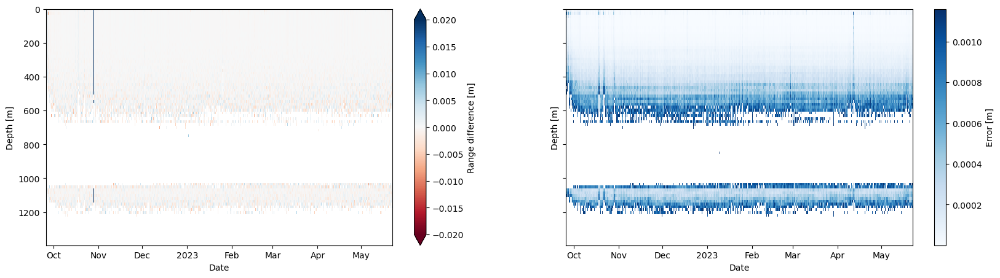

In [51]:
plot_displacement_2d(ds_full)

### No Summer 2023 data

## Station A13

### Summer 2022

In [52]:
to_plot  = custom_stacked_profile_series(ds_103.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


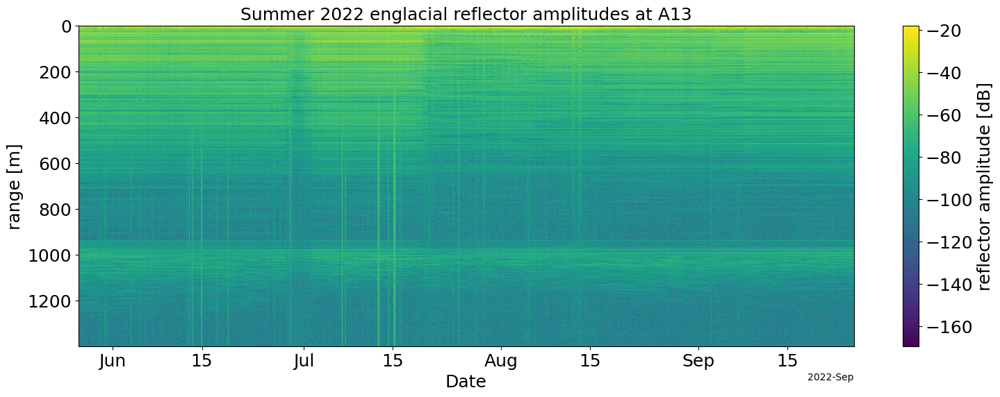

In [53]:
plot_profile(to_plot,'A13','Summer 2022')

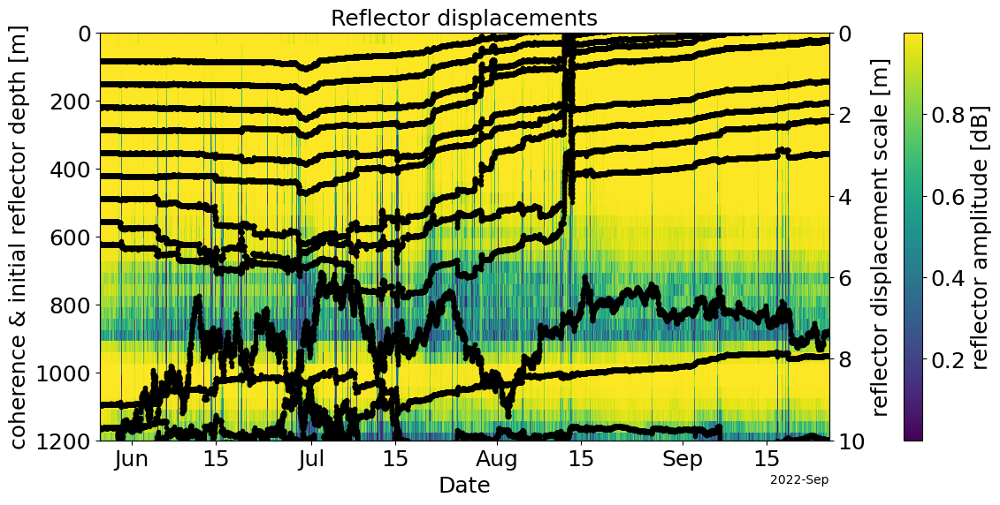

In [54]:
ds_full = plot_displacement(to_plot,80,1)

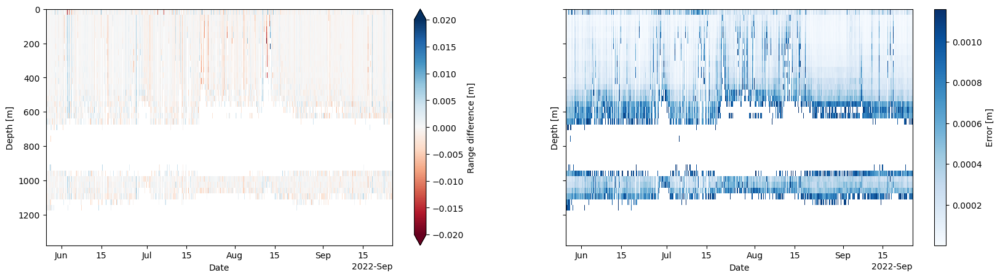

In [55]:
plot_displacement_2d(ds_full)

### Winter 2022-2023

In [56]:
to_plot = ds_103_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


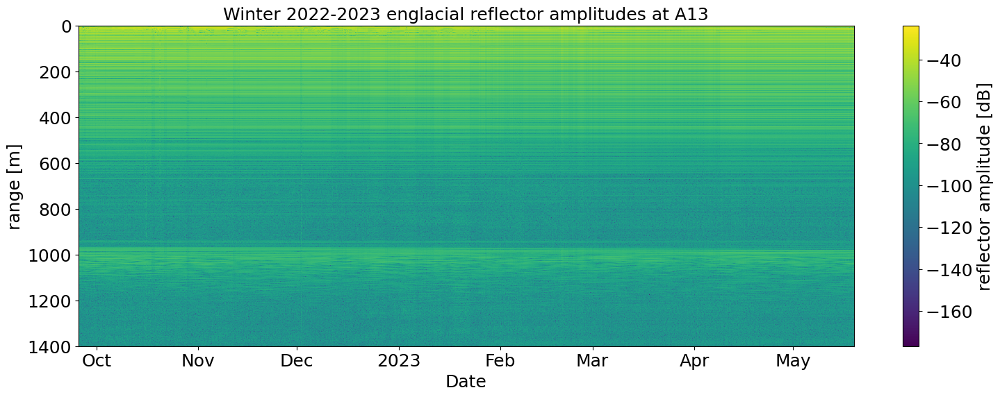

In [57]:
plot_profile(to_plot,'A13','Winter 2022-2023')

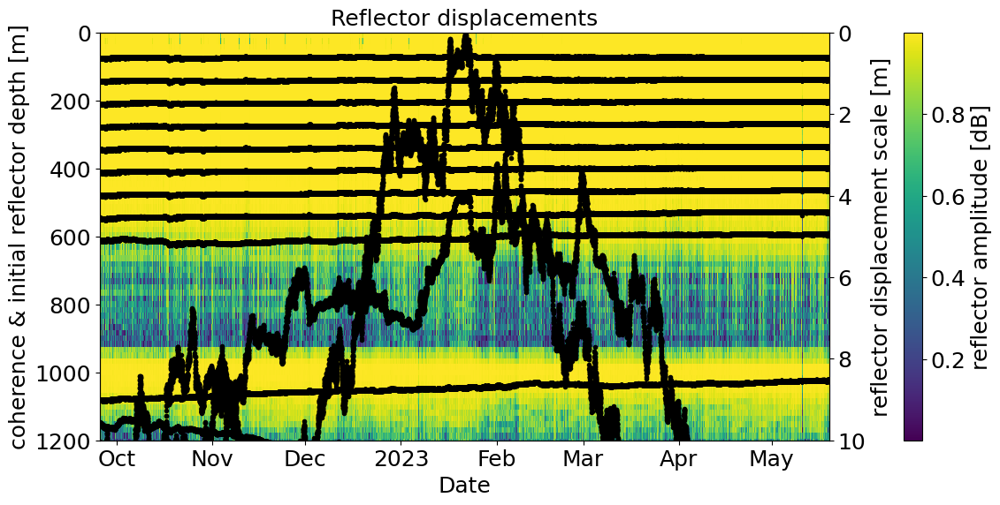

In [58]:
ds_full = plot_displacement(to_plot,80,1)

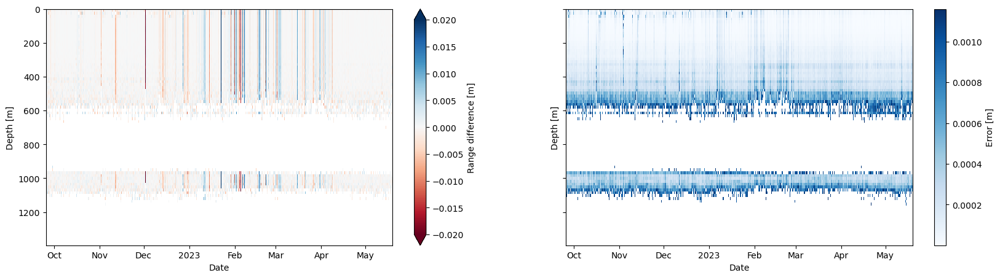

In [59]:
plot_displacement_2d(ds_full)

### Summer 2023

In [60]:
to_plot  = custom_stacked_profile_series(ds_103_s.chirp.isel(attenuator_setting_pair=2),2,3e8,4e8)


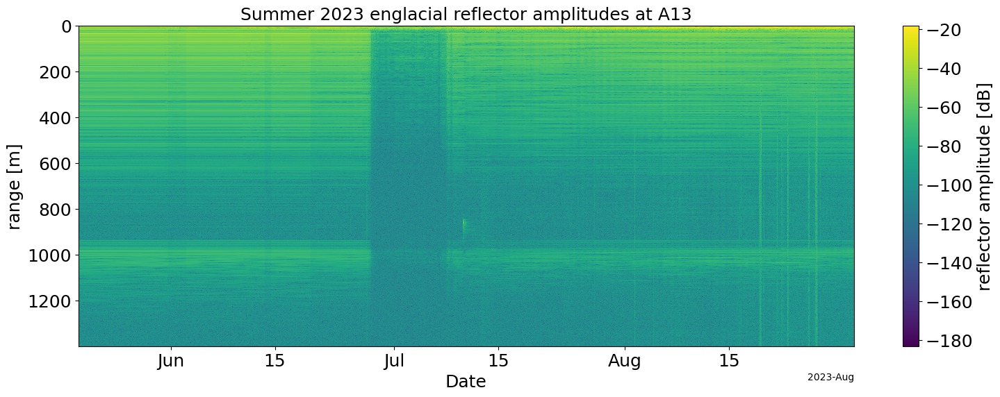

In [61]:
plot_profile(to_plot,'A13','Summer 2023')

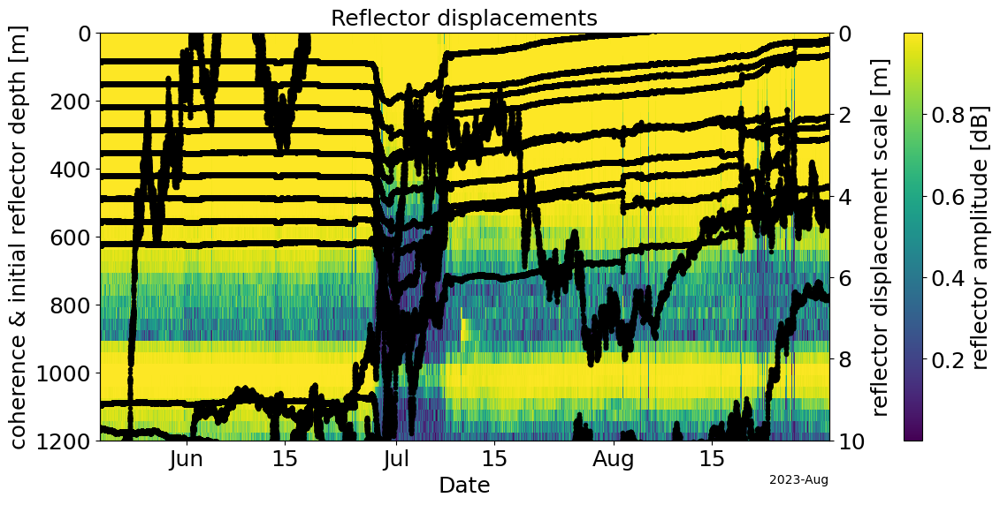

In [64]:
ds_full = plot_displacement(to_plot,80,1)

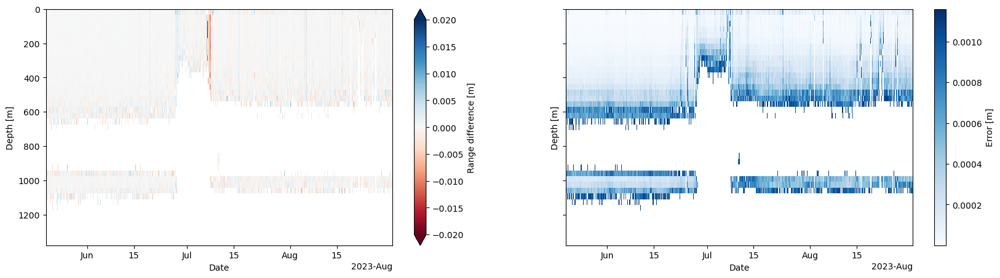

In [65]:
plot_displacement_2d(ds_full)

## Station A14

### Summer 2022

In [66]:
to_plot = ds_104.profile_stacked.isel(attenuator_setting_pair=0).compute()


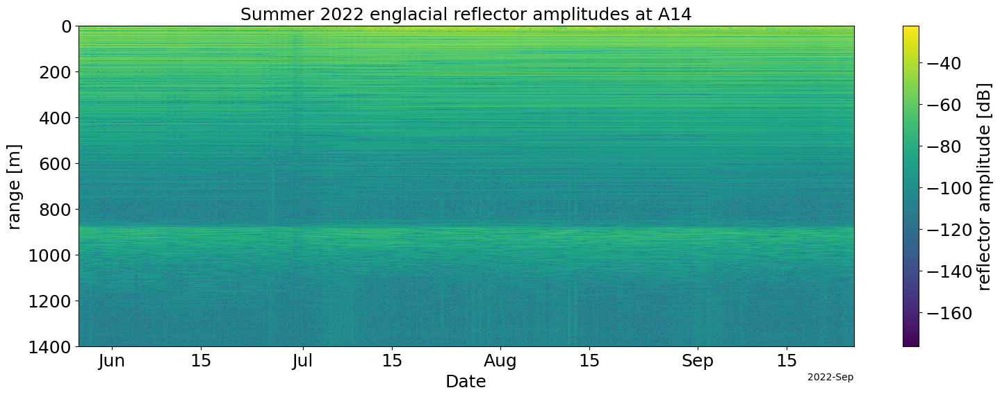

In [67]:
plot_profile(to_plot,'A14','Summer 2022')

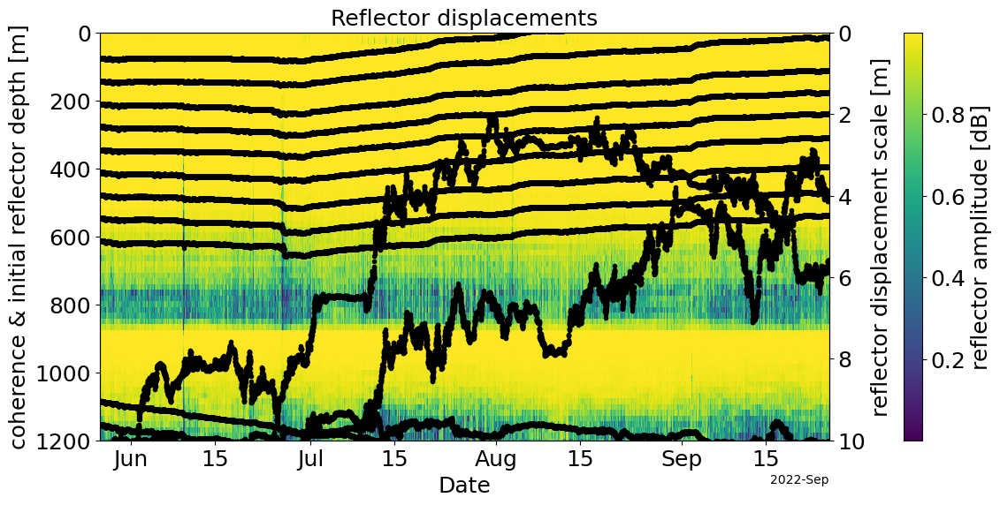

In [68]:
ds_full = plot_displacement(to_plot,80,1)

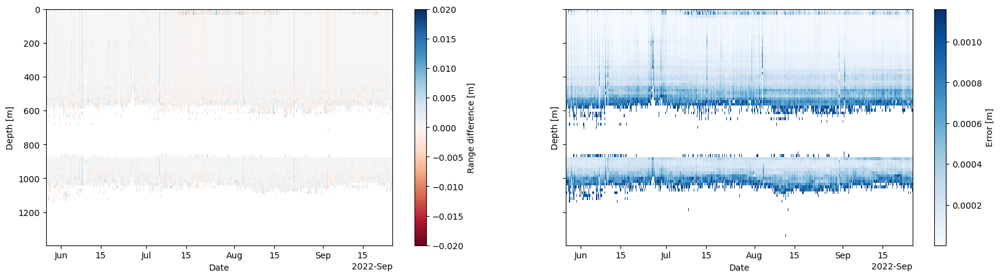

In [69]:
plot_displacement_2d(ds_full)

### Winter 2022-2023

In [70]:
to_plot = ds_104_w.profile_stacked.isel(attenuator_setting_pair=0).compute()


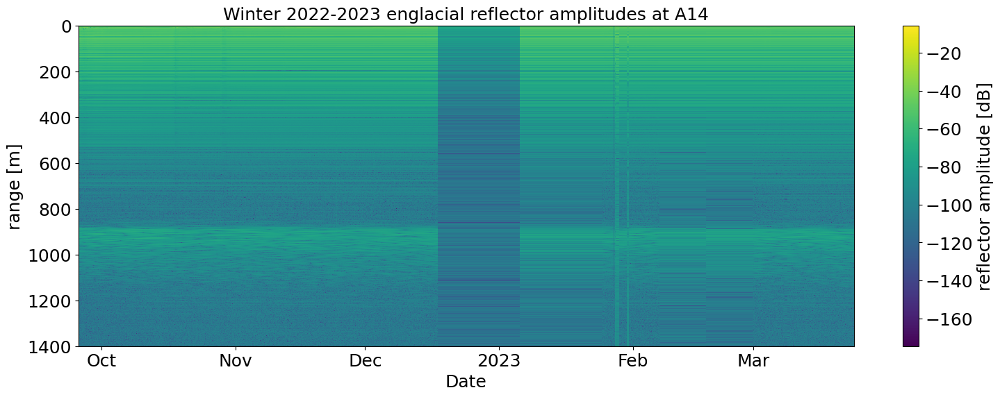

In [71]:
plot_profile(to_plot,'A14','Winter 2022-2023')

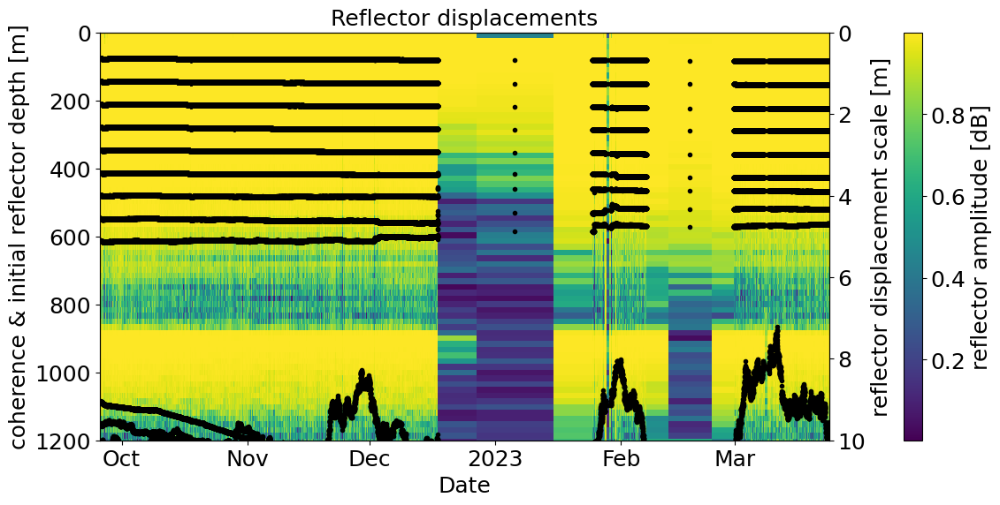

In [72]:
ds_full = plot_displacement(to_plot,80,1)

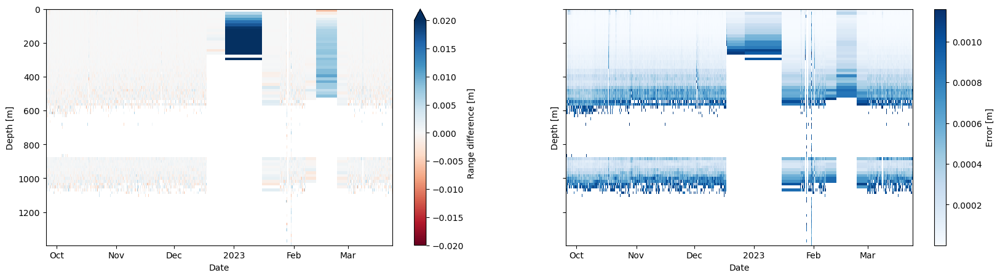

In [73]:
plot_displacement_2d(ds_full)

### Summer 2023

In [74]:
to_plot  = custom_stacked_profile_series(ds_104_s.chirp.isel(attenuator_setting_pair=0),2,3e8,4e8)


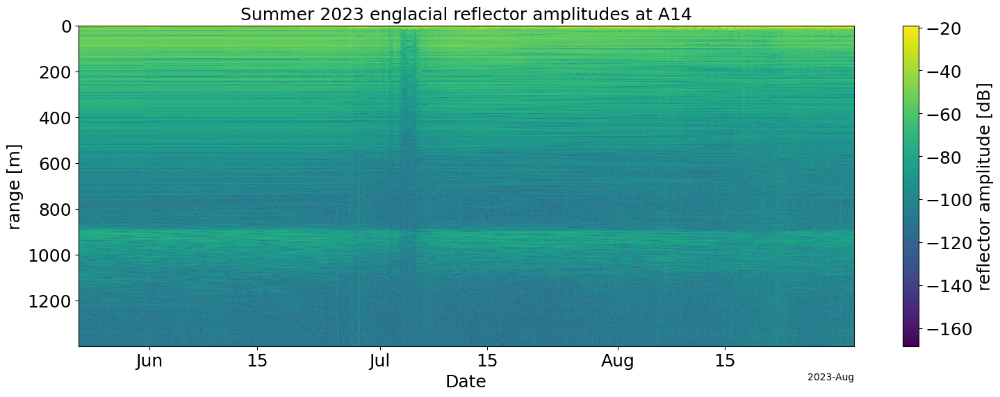

In [75]:
plot_profile(to_plot,'A14','Summer 2023')

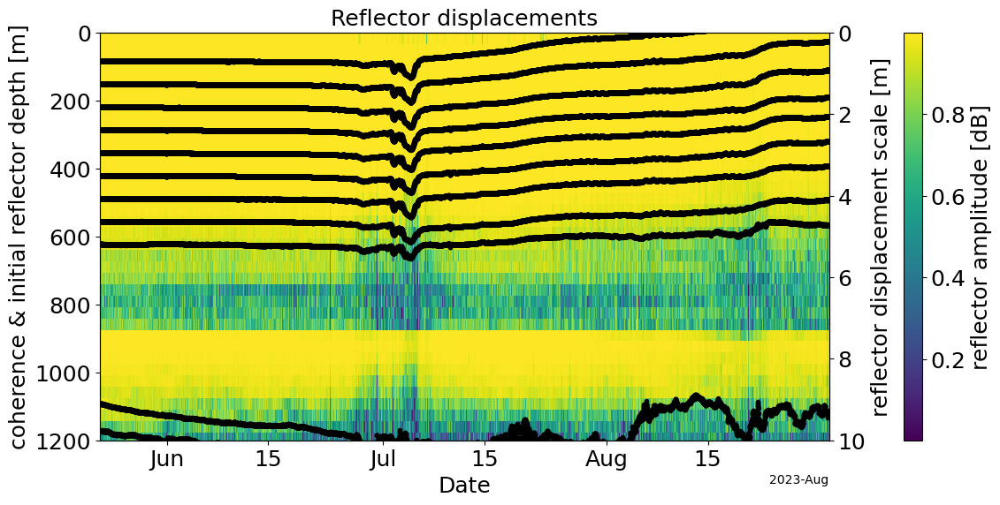

In [76]:
ds_full = plot_displacement(to_plot,80,1)

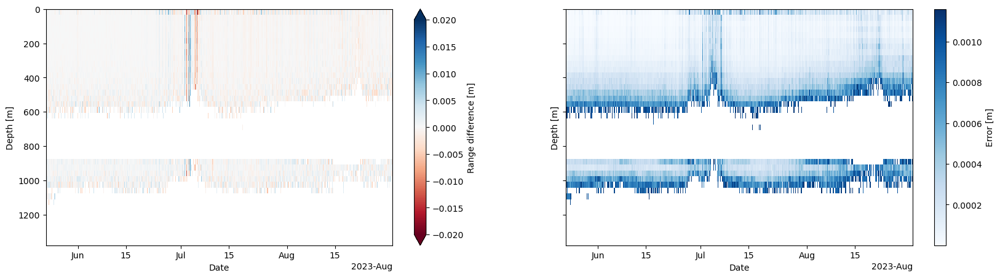

In [77]:
plot_displacement_2d(ds_full)

# Lake drainage

## A11

In [78]:
to_plot  = custom_stacked_profile_series(ds_101.chirp.isel(attenuator_setting_pair=1,time=range(4400,4900)),2,3e8,4e8)


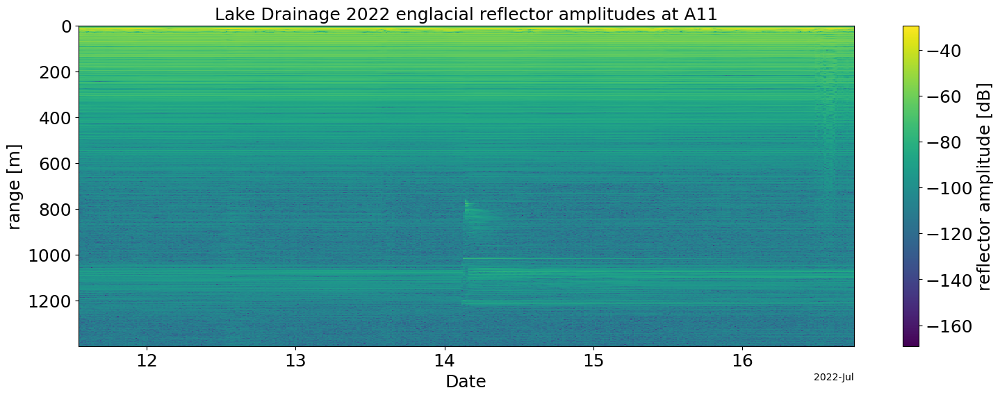

In [79]:
plot_profile(to_plot,'A11','Lake Drainage 2022')

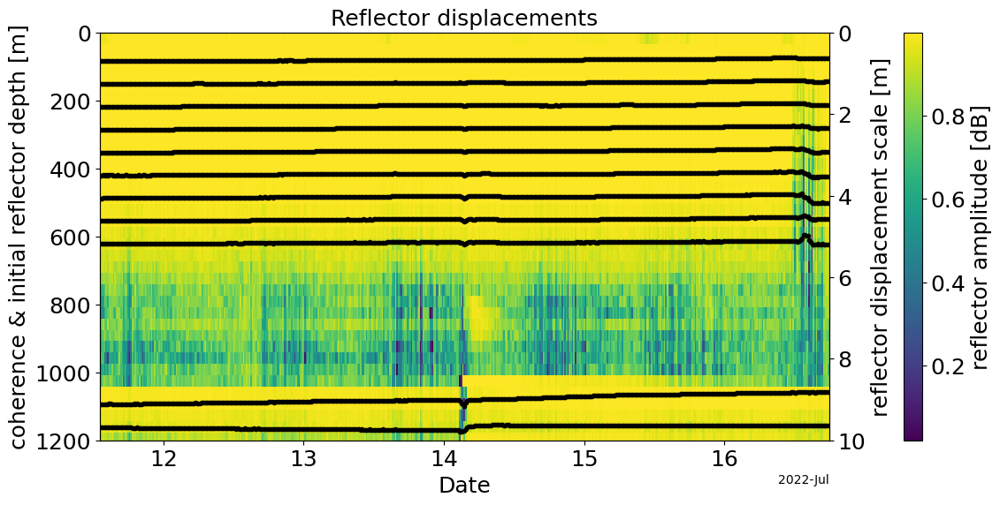

In [80]:
ds_full = plot_displacement(to_plot,80,1)

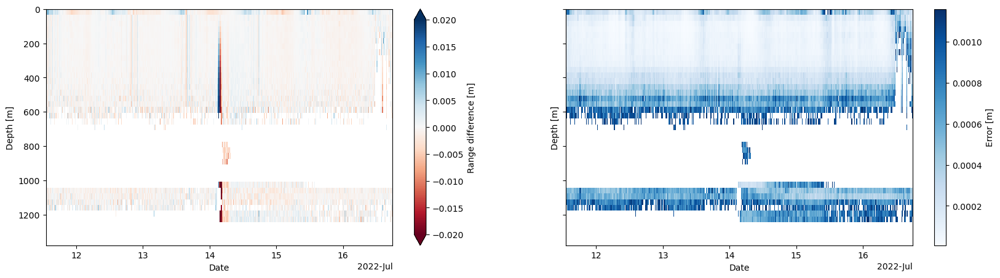

In [81]:
plot_displacement_2d(ds_full)

## A13

In [82]:
to_plot  = custom_stacked_profile_series(ds_103.chirp.isel(attenuator_setting_pair=1,time=range(4400,4900)),2,3e8,4e8)


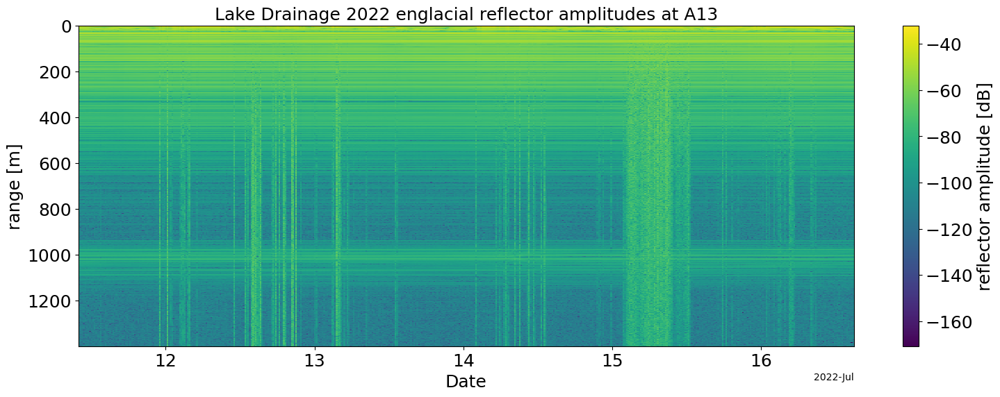

In [83]:
plot_profile(to_plot,'A13','Lake Drainage 2022')

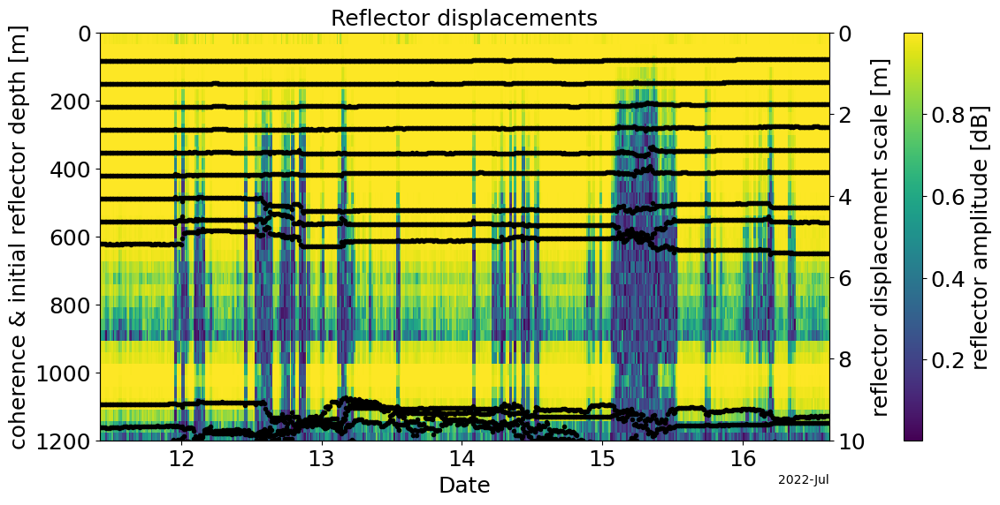

In [84]:
ds_full = plot_displacement(to_plot,80,1)

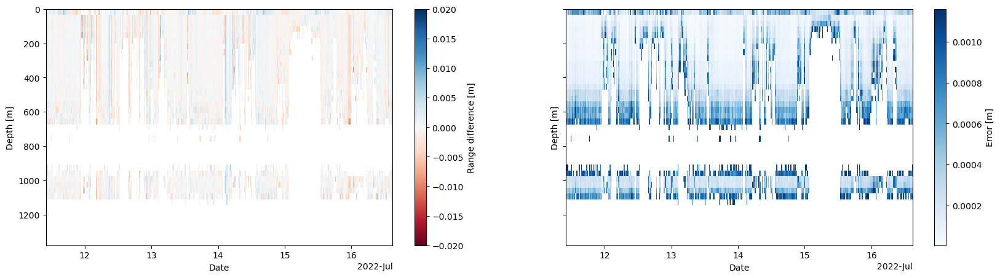

In [85]:
plot_displacement_2d(ds_full)

## A14

In [86]:
to_plot  = custom_stacked_profile_series(ds_104.chirp.isel(attenuator_setting_pair=0,time=range(4400,4900)),2,3e8,4e8)


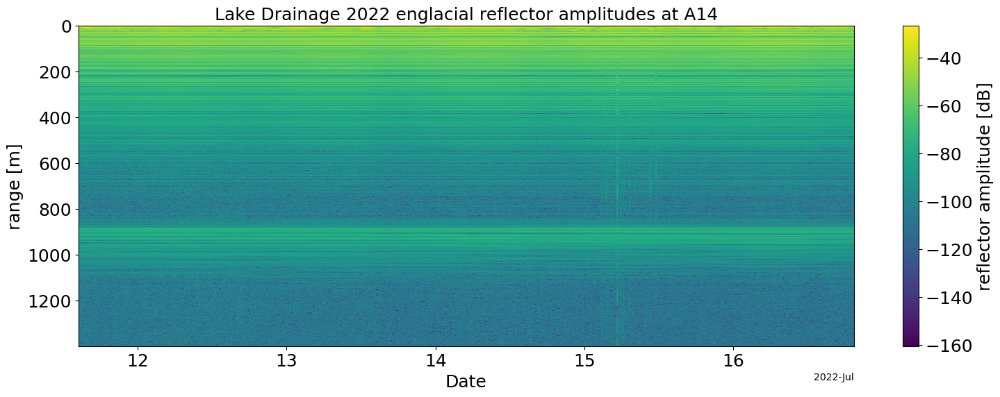

In [87]:
plot_profile(to_plot,'A14','Lake Drainage 2022')

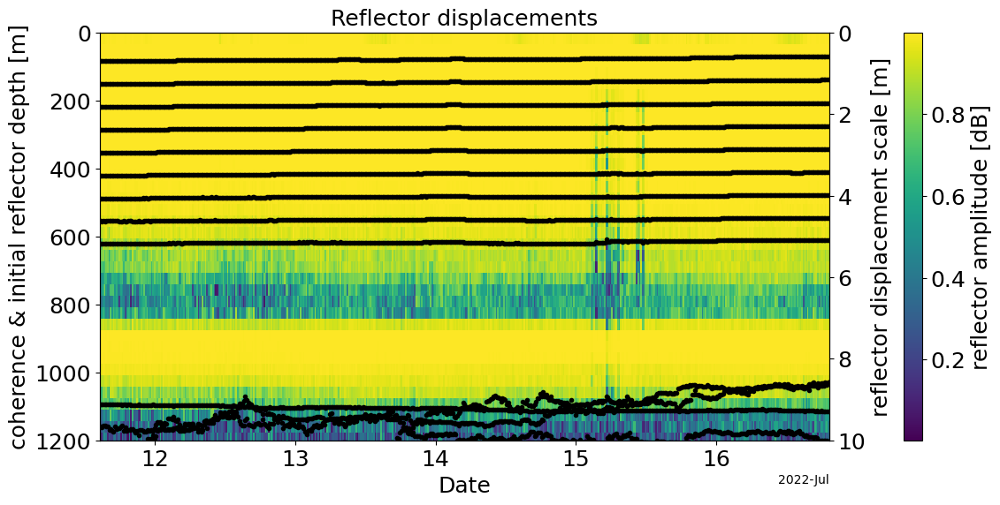

In [88]:
ds_full = plot_displacement(to_plot,80,1)

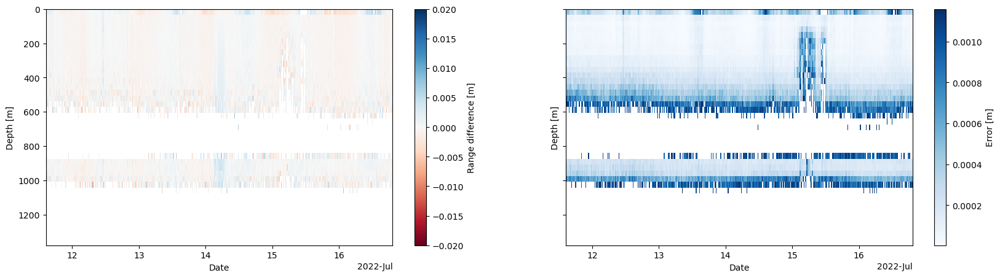

In [89]:
plot_displacement_2d(ds_full)